# Titanic: Machine Learning from Disaster

In [1]:
# https://www.kaggle.com/c/titanic

In [1]:
import sklearn
import pandas as pd

In [3]:
# Загружаем данные из файлов
train = pd.read_csv('./homework/train.csv')
test = pd.read_csv('./homework/test.csv')

In [4]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## Предобработка данных

In [5]:
# Заполняем пропуски в данных медианными 
# значениями факторов на обучающей выборке
train_median = train.median()
train_imp = train.fillna(train_median)
test_imp = test.fillna(train_median)

In [9]:
train_median

PassengerId    446.0000
Survived         0.0000
Pclass           3.0000
Age             28.0000
SibSp            0.0000
Parch            0.0000
Fare            14.4542
dtype: float64

In [10]:
# Бинаризуем категориальные признаки
CATEGORY_COL = ['Sex', 'Pclass', 'Embarked']
train_dummies = pd.get_dummies(train_imp, columns=CATEGORY_COL, drop_first=True)
test_dummies = pd.get_dummies(test_imp, columns=CATEGORY_COL, drop_first=True)

In [11]:
train_dummies.head()

,PassengerId,Survived,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_male,Pclass_2,Pclass_3,Embarked_Q,Embarked_S
0,1,0,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,NaN,1,0,1,0,1
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C85,0,0,0,0,0
2,3,1,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,NaN,0,0,1,0,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,C123,0,0,0,0,1
4,5,0,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,NaN,1,0,1,0,1


In [12]:
# Удаляем лишние столбцы
DROP_COL = ['PassengerId', 'Name', 'Ticket', 'Cabin']
TARGET_COL = 'Survived'
X_train = train_dummies.drop(DROP_COL + [TARGET_COL], axis=1)
y_train = train_dummies[TARGET_COL]
X_test = test_dummies.drop(DROP_COL, axis=1)

## Предсказание моделей для стеккинга

In [13]:
import numpy as np
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

def cross_val_predict_proba(estimator, X_train, y_train):
    kfold = KFold(n_splits=4, shuffle=True, random_state=12345)
    return cross_val_predict(estimator, X_train, y_train, cv=kfold, method='predict_proba')

# TODO: подобрать гиперпараметры для ансамблей -->

In [35]:
from sklearn.pipeline import  Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
%matplotlib inline

In [39]:
kfold = KFold(n_splits=4, shuffle=True, random_state=12345)

In [41]:
#функция для оценки качества модели
from sklearn import metrics

def auc_prc(train, predicted, predicted_proba ): 
    accuracy = metrics.accuracy_score( y_train, y_predicted )
    precision = metrics.precision_score( y_train, y_predicted ) 
    recall = metrics.recall_score( y_train, y_predicted ) 
    roc_auc = metrics.roc_auc_score( y_train, y_predicted_proba[:, 1] )
    prc_auc = metrics.average_precision_score( y_train, y_predicted_proba[:, 1] )
    
    pr, re, thres = metrics.precision_recall_curve(train, predicted_proba)
    fpr, tpr, thres2 = metrics.roc_curve( train, predicted_proba)
        
    print('accuracy = ', accuracy, sep='\t')
    print('precision = ', precision, sep='\t')
    print('recall = ', recall, sep='\t')
    print('roc_auc = ', roc_auc, sep='\t')
    print('prc_auc = ', prc_auc, sep='\t') 

### Подбираем параметры модели №1 : RandomForest

### Первый способ - поиск по сетке

In [49]:
#making a pipeline
pipelineRFC = Pipeline( steps=[ (  "model", RandomForestClassifier(n_estimators=200)  ) ] )

paramsRFC = {"model__max_depth": list(range(3, 10, 1)),
             "model__max_features": list(range(2, 7, 1)),
             "model__min_samples_leaf": list(range( 2, 10, 1)),
             "model__min_samples_split": list(range(2, 10, 1)) }

#формируем объект
gridRFC = GridSearchCV(pipelineRFC, paramsRFC, 
                    scoring='accuracy', verbose=10, 
                    cv=kfold, n_jobs=-1)

In [50]:
#запускаем отладку модели и смотрим на предложенные параметры
modelRFC = gridRFC.fit( X_train, y_train )
modelRFC.best_params_

#Перебор параметров выдал следующую комбинацию параметров, которая не дала повышения в качестве, поэтому был предпринят
#второй заход поиска оптимальной комбинации - о нем - см.след.ячейку тетрадки
"""
{'model__max_depth': 9,
 'model__max_features': 6,
 'model__min_samples_leaf': 2,
 'model__min_samples_split': 5}
"""

Fitting 4 folds for each of 2240 candidates, totalling 8960 fits
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.766816, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, 

[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    1.9s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3, score=0.843049, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.771300, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.0s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.828829, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.771300, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.825112, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    5.0s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6, score=0.833333, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=7, score=0.753363, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=7, score=0.834081, total=   0.8s
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=7, score=0.811659, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8 
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    6.4s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.753363, total=   0.8s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.825112, total=   0.8s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.847534, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.846847, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    8.9s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.766816, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.843049, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.3s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, score=0.851351, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.771300, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   13.9s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7, score=0.846847, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8, score=0.766816, total=   0.8s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   16.9s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.847534, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, score=0.771300, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:   21.1s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5, score=0.843049, total=   1.2s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5, score=0.851351, total=   1.3s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6, score=0.789238, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6, score=0.825112, total=   1.2s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:   24.6s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=8, score=0.833333, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.757848, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.807175, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.838565, total=   0.8s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed:   28.5s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4, score=0.819820, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.757848, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   32.5s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8, score=0.771300, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8, score=0.833333, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:   36.9s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4, score=0.843049, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4, score=0.828829, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=5, score=0.753363, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=5, score=0.834081, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   41.1s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.838565, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9, score=0.771300, total=   0.8s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:   46.2s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.811659, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.834081, total=   1.0s
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.824324, total=   0.9s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6, score=0.766816, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   51.5s


[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=2, score=0.843049, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=2, score=0.828829, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.771300, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, mode

[Parallel(n_jobs=-1)]: Done 213 tasks      | elapsed:   57.1s


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.843049, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.819820, total=   1.2s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8, score=0.829596, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8, score=0.762332, total=   1.2s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:  1.0min


[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.837838, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5, score=0.762332, total=   1.0s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5, score=0.807175, total=   1.1s
[CV] model__max_depth=3, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:  1.1min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2, score=0.838565, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2, score=0.851351, total=   1.1s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3, score=0.789238, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:  1.2min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.816143, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.771300, total=   1.1s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.855856, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 305 tasks      | elapsed:  1.4min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=6, score=0.847534, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=6, score=0.851351, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7, score=0.789238, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:  1.5min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.855856, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  1.6min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.820628, total=   1.1s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4, score=0.789238, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.855856, total=   1.2s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 384 tasks      | elapsed:  1.7min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.789238, total=   1.1s
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.851351, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  1.8min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=9, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2, score=0.789238, total=   1.1s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.0min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 473 tasks      | elapsed:  2.1min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.816143, total=   0.8s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.838565, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.860360, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.789238, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:  2.2min


[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:  2.4min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.834081, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 570 tasks      | elapsed:  2.5min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=8, score=0.846847, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.789238, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, mod

[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9, score=0.789238, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 


[Parallel(n_jobs=-1)]: Done 605 tasks      | elapsed:  2.7min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9, score=0.838565, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.807175, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  2.8min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.834081, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=4, mod

[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4 


[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:  3.0min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3, score=0.837838, total=   0.8s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4, score=0.811659, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=4, mod

[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4, score=0.811659, total=   1.2s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4, score=0.825112, total=   1.1s


[Parallel(n_jobs=-1)]: Done 714 tasks      | elapsed:  3.1min


[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4, score=0.828829, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5, score=0.829596, total=   1.1s
[CV] model__max_depth=3, model__max_features=4, mode

[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5, score=0.860360, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6, score=0.789238, total=   1.0s
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7 
[CV] model__max_depth=3, model__max_features=4, mode

[Parallel(n_jobs=-1)]: Done 753 tasks      | elapsed:  3.3min


[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6, score=0.820628, total=   0.8s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6, score=0.846847, total=   1.0s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7, score=0.807175, total=   0.9s
[CV] model__max_depth=3, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=4, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7, score=0.838565, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7, score=0.851351, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 


[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.5min


[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.843049, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 833 tasks      | elapsed:  3.6min


[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.851351, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3, score=0.775785, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.811659, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:  3.8min


[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4, score=0.842342, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.780269, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=5, score=0.834081, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=5, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.784753, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 917 tasks      | elapsed:  4.0min


[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.784753, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.802691, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8, score=0.802691, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 960 tasks      | elapsed:  4.2min


[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.798206, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, mod

[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.798206, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=3, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  4.4min


[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=5, score=0.824324, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=6, score=0.807175, total=   0.9s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=6, score=0.780269, total=   1.0s
[CV] model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=6, score=0.825112, total=   0.8s
[CV] model__max_depth=3, model__max_features=5, mode

[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6, score=0.825112, total=   1.1s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6, score=0.846847, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7, score=0.780269, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, mode

[Parallel(n_jobs=-1)]: Done 1050 tasks      | elapsed:  4.6min


[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, mod

[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.771300, total=   1.1s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.838565, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=3, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 1097 tasks      | elapsed:  4.8min


[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4, score=0.851351, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5, score=0.775785, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5, score=0.843049, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5, score=0.811659, total=   1.1s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, mod

[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.838565, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.842342, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6, score=0.775785, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6, score=0.816143, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=3, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 1144 tasks      | elapsed:  5.0min


[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.820628, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.834081, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.837838, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, mod

[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.834081, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 1193 tasks      | elapsed:  5.2min


[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.802691, total=   1.1s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.829596, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.837838, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5, score=0.775785, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, mod

[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.780269, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.825112, total=   0.8s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.798206, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.824324, total=   1.0s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=3, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.4min


[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=9 
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=9, score=0.766816, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=9, score=0.802691, total=   0.9s
[CV] model__max_depth=3, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, mod

[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=9, score=0.802691, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=3, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=9, score=0.824324, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.789238, total=   0.8s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 1293 tasks      | elapsed:  5.6min


[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.865471, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.837838, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6, score=0.789238, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, mod

[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.860987, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.833333, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 1344 tasks      | elapsed:  5.8min


[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, score=0.784753, total=   0.8s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.856502, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, score=0.837838, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, mod

[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.789238, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.856502, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.824324, total=   0.8s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 1397 tasks      | elapsed:  6.0min


[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7, score=0.838565, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7, score=0.824324, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=2, mod

[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.847534, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  6.3min


[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.838565, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.833333, total=   1.2s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, mod

[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.820628, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.843049, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.833333, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6, score=0.784753, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 1505 tasks      | elapsed:  6.5min


[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=2, score=0.843049, total=   1.0s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=3, score=0.793722, total=   0.9s
[CV] model__max_depth=4, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=2, mod

[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3, score=0.789238, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3, score=0.860360, total=   0.9s
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=3, score=0.860987, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=4 
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 1560 tasks      | elapsed:  6.7min


[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.847534, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.851351, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=3, mod

[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.834081, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.847534, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 1617 tasks      | elapsed:  7.0min


[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=6, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=6, score=0.856502, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=6, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=7, score=0.784753, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=3, mod

[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=7, score=0.816143, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=7, score=0.851351, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=7, score=0.856502, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 1674 tasks      | elapsed:  7.2min


[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.833333, total=   0.8s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.856502, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, mod

[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5, score=0.820628, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5, score=0.852018, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6, score=0.825112, total=   0.8s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 1733 tasks      | elapsed:  7.5min


[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3, score=0.837838, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.838565, total=   0.8s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.825112, total=   0.8s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.784753, total=   1.1s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, mod

[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4, score=0.843049, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4, score=0.837838, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5, score=0.811659, total=   0.9s
[CV] model__max_depth=4, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  7.7min


[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.860987, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, mod

[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.846847, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.852018, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 1853 tasks      | elapsed:  8.0min


[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.856502, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, mod

[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.789238, total=   1.1s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.816143, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.852018, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.851351, total=   1.1s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 1914 tasks      | elapsed:  8.2min


[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.838565, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.855856, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, mod

[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.816143, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.843049, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.855856, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2, score=0.775785, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed:  8.5min


[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=8, score=0.829596, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=8, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, mod

[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=9, score=0.780269, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=9, score=0.798206, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=9, score=0.838565, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=9, score=0.846847, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 2040 tasks      | elapsed:  8.8min


[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.838565, total=   1.0s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.851351, total=   0.9s
[CV] model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9, score=0.780269, total=   0.8s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9, score=0.802691, total=   1.1s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=4, mod

[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.825112, total=   0.8s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 2105 tasks      | elapsed:  9.0min


[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=8, score=0.852018, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, mod

[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.829596, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 2170 tasks      | elapsed:  9.3min


[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.780269, total=   0.8s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8, score=0.852018, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, mod

[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9, score=0.838565, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 2237 tasks      | elapsed:  9.6min


[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.775785, total=   1.1s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, mod

[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.807175, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 2304 tasks      | elapsed:  9.9min


[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.775785, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.847534, total=   1.1s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 2373 tasks      | elapsed: 10.2min


[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.847534, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.846847, total=   0.9s
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.775785, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.847534, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 10.5min


[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4, score=0.838565, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5, score=0.825112, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5, score=0.816143, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5, score=0.843049, total=   1.0s
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6 
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6, score=0.775785, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=7 


[Parallel(n_jobs=-1)]: Done 2513 tasks      | elapsed: 10.8min


[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6, score=0.816143, total=   1.1s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6, score=0.842342, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6, score=0.834081, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=7, score=0.775785, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7, score=0.780269, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7, score=0.829596, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7, score=0.807175, total=   1.0s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7, score=0.846847, total=   0.9s
[CV] model__max_depth=4, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=4, model__max_features=6, mod

[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8 
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8 


[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed: 11.1min


[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.834081, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.856502, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.833333, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8, score=0.860987, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.789238, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.860987, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.856502, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.833333, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.789238, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 


[Parallel(n_jobs=-1)]: Done 2657 tasks      | elapsed: 11.4min


[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.843049, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3, score=0.834081, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3, score=0.833333, total=   1.1s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=4, score=0.789238, total=   1.1s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.860987, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.820628, total=   1.2s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 


[Parallel(n_jobs=-1)]: Done 2730 tasks      | elapsed: 11.8min


[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4, score=0.837838, total=   1.1s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.784753, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.825112, total=   1.1s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.824324, total=   0.8s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.834081, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.837838, total=   1.1s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 2805 tasks      | elapsed: 12.1min


[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7, score=0.843049, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7, score=0.837838, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.784753, total=   1.0s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=2, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.834081, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.852018, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9 
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__

[Parallel(n_jobs=-1)]: Done 2880 tasks      | elapsed: 12.4min


[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.847534, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.846847, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, score=0.789238, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.856502, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.837838, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3, score=0.846847, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.789238, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.856502, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 2957 tasks      | elapsed: 12.7min


[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5, score=0.837838, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=6, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6, score=0.820628, total=   1.1s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6, score=0.843049, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7, score=0.789238, total=   1.1s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=7, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=7, score=0.811659, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=7, score=0.843049, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=7, score=0.837838, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 3034 tasks      | elapsed: 13.1min


[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.856502, total=   0.9s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.789238, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=5, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, mod

[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.811659, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.837838, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.829596, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.860987, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 3113 tasks      | elapsed: 13.4min


[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, score=0.816143, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, score=0.843049, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, score=0.851351, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5, score=0.775785, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.834081, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.846847, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.852018, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=5, score=0.846847, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6, score=0.847534, total=   0.9s
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 13.8min


[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.784753, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.820628, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.847534, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.829596, total=   1.1s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.842342, total=   1.2s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.780269, total=   1.2s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed: 14.1min


[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4, score=0.838565, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4, score=0.846847, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=5, score=0.798206, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5, score=0.807175, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5, score=0.851351, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=4, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6, score=0.838565, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6, score=0.852018, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6, score=0.846847, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 3354 tasks      | elapsed: 14.5min


[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.856502, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.825112, total=   1.1s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.846847, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.820628, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.856502, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 3437 tasks      | elapsed: 14.8min


[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.811659, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.852018, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=5, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6, score=0.775785, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.816143, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.838565, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=6, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.775785, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.843049, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 3520 tasks      | elapsed: 15.2min


[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.802691, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.833333, total=   0.9s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.798206, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.843049, total=   1.0s
[CV] model__max_depth=5, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=5, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.852018, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.780269, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 3605 tasks      | elapsed: 15.6min


[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7, score=0.829596, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7, score=0.852018, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=7, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=8, score=0.771300, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=8, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=8, score=0.820628, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=8, score=0.852018, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=9, score=0.775785, total=   1.1s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=9, score=0.825112, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=5, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 3690 tasks      | elapsed: 15.9min


[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.851351, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.771300, total=   1.1s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.816143, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.838565, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5, score=0.842342, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5, score=0.843049, total=   1.1s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6, score=0.771300, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=6, score=0.816143, total=   1.1s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6, score=0.838565, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6, score=0.816143, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=6, score=0.833333, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=7, score=0.775785, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=5, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 3777 tasks      | elapsed: 16.3min


[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=2, score=0.851351, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3, score=0.834081, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3, score=0.811659, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3, score=0.775785, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.834081, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.766816, total=   0.9s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.842342, total=   1.1s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.802691, total=   1.0s
[CV] model__max_depth=5, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=5, model__max_features=6, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.838565, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.828829, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 3864 tasks      | elapsed: 16.7min


[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=8, score=0.824324, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=8, score=0.819820, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.820628, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=9, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.856502, total=   1.1s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.828829, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 3953 tasks      | elapsed: 17.1min


[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6, score=0.856502, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6, score=0.820628, total=   1.1s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6, score=0.824324, total=   1.1s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7, score=0.789238, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7, score=0.860987, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7, score=0.824324, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=8, score=0.820628, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed: 17.5min


[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.816143, total=   1.0s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.847534, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5, score=0.852018, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5, score=0.824324, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.789238, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.816143, total=   0.9s
[CV] model__max_depth=6, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=2, mod

[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=6, score=0.829596, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=6, score=0.852018, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=6, score=0.837838, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=6, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 4133 tasks      | elapsed: 17.9min


[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, score=0.852018, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, score=0.842342, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, score=0.784753, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, mod

[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.784753, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.852018, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.829596, total=   1.1s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, score=0.833333, total=   1.4s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, mod

[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4, score=0.828829, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=5, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=5, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=5, score=0.834081, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=6, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 4224 tasks      | elapsed: 18.3min


[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.852018, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, mod

[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, mod

[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3, score=0.843049, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3, score=0.842342, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.784753, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.811659, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 4317 tasks      | elapsed: 18.7min


[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.816143, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.847534, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.842342, total=   0.9s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=6, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=3, mod

[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, mod

[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.846847, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.784753, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.811659, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, score=0.852018, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 4410 tasks      | elapsed: 19.1min


[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=8, score=0.842342, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=8, score=0.856502, total=   1.1s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, mod

[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9, score=0.837838, total=   1.1s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.820628, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=5, model__

[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.816143, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2, score=0.837838, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 4505 tasks      | elapsed: 19.5min


[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8, score=0.843049, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, mod

[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.811659, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, mod

[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.771300, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.807175, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 4600 tasks      | elapsed: 19.9min


[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.780269, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.802691, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.838565, total=   0.9s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.837838, total=   1.0s
[CV] model__max_depth=6, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=4, mod

[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.860987, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.829596, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.865471, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, mod

[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.856502, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.775785, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 4697 tasks      | elapsed: 20.4min


[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.780269, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, mod

[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.856502, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, mod

[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.775785, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.816143, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 4794 tasks      | elapsed: 20.8min


[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8, score=0.846847, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.807175, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, mod

[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9, score=0.843049, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.771300, total=   1.1s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.793722, total=   1.0s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9, score=0.846847, total=   1.3s
[CV] model__max_depth=6, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=5, mod

[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.825112, total=   1.1s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.860987, total=   1.1s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.833333, total=   1.4s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 4893 tasks      | elapsed: 21.3min


[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.852018, total=   1.1s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2, score=0.771300, total=   0.9s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2, score=0.825112, total=   1.1s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, mod

[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=2, score=0.852018, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, mod

[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=3, score=0.771300, total=   1.1s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=3, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=3, score=0.847534, total=   0.9s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=3, score=0.833333, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed: 21.7min


[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2, score=0.825112, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2, score=0.843049, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, mod

[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2, score=0.824324, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=3, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=3, score=0.838565, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, mod

[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3, score=0.847534, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3, score=0.842342, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4, score=0.811659, total=   1.2s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 5093 tasks      | elapsed: 22.2min


[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.807175, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.838565, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.828829, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.771300, total=   1.0s
[CV] model__max_depth=6, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=6, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.834081, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.789238, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.856502, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=4, score=0.833333, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, score=0.824324, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.784753, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.856502, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 5194 tasks      | elapsed: 22.6min


[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, score=0.824324, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5, score=0.825112, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5, score=0.789238, total=   1.1s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5, score=0.847534, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.838565, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.824324, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6, score=0.820628, total=   0.8s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=6, score=0.820628, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=6, score=0.838565, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=6, score=0.824324, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 5297 tasks      | elapsed: 23.1min


[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6, score=0.834081, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=6, score=0.837838, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=7, score=0.793722, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.789238, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.825112, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.838565, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7, score=0.833333, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, mod

[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7, score=0.824324, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.789238, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 5400 tasks      | elapsed: 23.5min


[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.856502, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9, score=0.838565, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=3, mod

[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.856502, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, mod

[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=2, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=2, score=0.856502, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 5505 tasks      | elapsed: 24.0min


[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.843049, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3, score=0.816143, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=3, mod

[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.843049, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3, score=0.842342, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, mod

[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.780269, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.811659, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.843049, total=   1.0s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=4, score=0.824324, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 5610 tasks      | elapsed: 24.4min


[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4, score=0.838565, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4, score=0.833333, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5, score=0.807175, total=   0.9s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=5, score=0.780269, total=   1.1s
[CV] model__max_depth=7, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=3, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=5, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=5, score=0.852018, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=5, score=0.833333, total=   1.1s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=6, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6, score=0.860987, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6, score=0.833333, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6, score=0.824324, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7, score=0.825112, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8 


[Parallel(n_jobs=-1)]: Done 5717 tasks      | elapsed: 24.9min


[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7, score=0.852018, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7, score=0.846847, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8, score=0.784753, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=8, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.856502, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.833333, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.833333, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 


[Parallel(n_jobs=-1)]: Done 5824 tasks      | elapsed: 25.4min


[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.807175, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.843049, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.775785, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.798206, total=   0.9s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.838565, total=   1.0s
[CV] model__max_depth=7, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=4, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=3, score=0.852018, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=3, score=0.842342, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=4, score=0.852018, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=4, score=0.846847, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5, score=0.771300, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 5933 tasks      | elapsed: 25.9min


[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5, score=0.852018, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=5, score=0.833333, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=6, score=0.789238, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=6, score=0.820628, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=6, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=6, score=0.860987, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=6, score=0.842342, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=6, score=0.833333, total=   1.1s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=7, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=7, score=0.847534, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=7, score=0.842342, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7, score=0.837838, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 


[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed: 26.3min


[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.847534, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8, score=0.846847, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=9, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.843049, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.771300, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9, score=0.833333, total=   1.1s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.771300, total=   1.1s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.798206, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.846847, total=   0.9s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=7, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=5, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.852018, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.780269, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3, score=0.860987, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 6153 tasks      | elapsed: 26.8min


[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.856502, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.846847, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5, score=0.775785, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4, score=0.846847, total=   1.2s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=5, score=0.860987, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=5, score=0.851351, total=   1.1s
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6, score=0.784753, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.771300, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.856502, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.842342, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6, score=0.846847, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.780269, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.834081, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.847534, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=7, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 6264 tasks      | elapsed: 27.4min


[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.820628, total=   1.2s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.847534, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8, score=0.846847, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=9, score=0.789238, total=   1.2s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   1.6s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.816143, total=   1.5s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.842342, total=   1.3s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=9, score=0.838565, total=   1.7s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=9, score=0.837838, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=2, score=0.771300, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=2, score=0.816143, total=   1.2s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=2, score=0.825112, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=2, score=0.829596, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.762332, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=2, score=0.828829, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=3, score=0.802691, total=   0.9s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=7, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 6377 tasks      | elapsed: 28.0min


[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.798206, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.829596, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=4, score=0.828829, total=   1.0s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5, score=0.762332, total=   1.1s
[CV] model__max_depth=7, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=7, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.793722, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.834081, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.843049, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=5, score=0.828829, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=5, score=0.828829, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=6, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6, score=0.847534, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=6, score=0.837838, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7, score=0.834081, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=7, score=0.860987, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 6490 tasks      | elapsed: 28.5min


[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=8, score=0.819820, total=   1.1s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9, score=0.828829, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2, score=0.784753, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3, score=0.780269, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.784753, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.819820, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 6605 tasks      | elapsed: 29.0min


[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.816143, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.843049, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=5, score=0.828829, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=6, score=0.784753, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.843049, total=   0.9s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.829596, total=   1.0s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=6, score=0.824324, total=   0.8s
[CV] model__max_depth=8, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=2, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=6, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=7, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7, score=0.856502, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=7, score=0.833333, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8, score=0.789238, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=8, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 6720 tasks      | elapsed: 29.5min


[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.825112, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.847534, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=2, score=0.843049, total=   1.1s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.825112, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.843049, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=3, score=0.833333, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.784753, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=4, score=0.820628, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4, score=0.816143, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4, score=0.843049, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=4, score=0.833333, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 6837 tasks      | elapsed: 30.0min


[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=7, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8, score=0.780269, total=   1.0s
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=8, score=0.820628, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9 
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.816143, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.856502, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=3, mod

[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.780269, total=   1.1s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.847534, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.811659, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9, score=0.846847, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=4, mod

[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.846847, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.820628, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, score=0.856502, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 6954 tasks      | elapsed: 30.5min


[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=5, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=4, mod

[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.834081, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=5, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=6, score=0.829596, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=4, mod

[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6, score=0.847534, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=6, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=7, score=0.825112, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=5, model__

[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=7, score=0.771300, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=7, score=0.829596, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=7, score=0.838565, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=7, score=0.833333, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 7073 tasks      | elapsed: 31.1min


[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2, score=0.811659, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, mod

[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3, score=0.798206, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3, score=0.829596, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3, score=0.828829, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=8, model__

[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4, score=0.775785, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4, score=0.807175, total=   1.0s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4, score=0.843049, total=   0.9s
[CV] model__max_depth=8, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=4, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4, score=0.834081, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=4, score=0.851351, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5, score=0.780269, total=   1.1s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=5, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed: 31.6min


[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.780269, total=   1.0s
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.834081, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=8, score=0.846847, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=8, score=0.846847, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.829596, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.784753, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=9, score=0.847534, total=   1.1s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.789238, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2, score=0.816143, total=   1.1s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2, score=0.847534, total=   1.2s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3, score=0.775785, total=   1.1s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2, score=0.846847, total=   1.2s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 7313 tasks      | elapsed: 32.1min


[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.838565, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=6, score=0.837838, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7, score=0.766816, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=7, score=0.816143, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.811659, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.847534, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=7, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=8, score=0.775785, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=7, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=8, score=0.838565, total=   0.9s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=8, score=0.807175, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, mod

[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=8, score=0.837838, total=   1.0s
[CV] model__max_depth=8, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=9, score=0.771300, total=   0.9s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=9, score=0.802691, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=9, score=0.834081, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=8, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 7434 tasks      | elapsed: 32.7min


[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.838565, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=4, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5, score=0.780269, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=5, score=0.843049, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=5, score=0.838565, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=5, score=0.843049, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=5, score=0.846847, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=6, score=0.789238, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5, score=0.842342, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.820628, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.842342, total=   0.9s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=6, score=0.834081, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.780269, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6, score=0.851351, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.825112, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=7, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=8 
[CV]  model__max_depth=8, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 7557 tasks      | elapsed: 33.2min


[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.820628, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.834081, total=   0.9s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.846847, total=   0.9s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4, score=0.775785, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.789238, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.820628, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.847534, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.842342, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4, score=0.838565, total=   1.1s
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4, score=0.833333, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5 
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.820628, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.834081, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, mod

[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5, score=0.829596, total=   1.0s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6, score=0.771300, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5, score=0.837838, total=   1.4s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6, score=0.802691, total=   1.1s
[CV] model__max_depth=8, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=8, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 7680 tasks      | elapsed: 33.8min


[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.775785, total=   1.1s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.825112, total=   1.2s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=2, score=0.856502, total=   1.2s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, mod

[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, score=0.828829, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.789238, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.825112, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, score=0.819820, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, mod

[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, score=0.852018, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, score=0.828829, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, score=0.784753, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, score=0.838565, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, mod

[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4, score=0.816143, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=4, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=5, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=2, mod

[Parallel(n_jobs=-1)]: Done 7805 tasks      | elapsed: 34.4min


[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=5, model__min_samples_split=9, score=0.819820, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2, score=0.784753, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2, score=0.820628, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=6, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=9, model__max_features=2, mode

[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2, score=0.838565, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3, score=0.816143, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=7, model__min_samples_split=3, score=0.784753, total=   1.0s
[CV] model__max_depth=9, model__max_features=2, mode

[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=3, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=8, model__min_samples_split=4, score=0.784753, total=   0.9s
[CV]  model__max_depth=9, model__max_features=2, mod

[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.784753, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.829596, total=   0.8s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.843049, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=4, score=0.833333, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, mode

[Parallel(n_jobs=-1)]: Done 7930 tasks      | elapsed: 34.9min


[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=8, score=0.828829, total=   0.9s
[CV] model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9, score=0.784753, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9, score=0.816143, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=2, model__min_samples_leaf=9, model__min_samples_split=9, score=0.838565, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=2, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9, score=0.852018, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=2, model__min_samples_split=9, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, score=0.829596, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.825112, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, score=0.784753, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.775785, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.829596, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.856502, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=3, score=0.828829, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 8057 tasks      | elapsed: 35.4min


[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=8, score=0.833333, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=9, score=0.775785, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=5, model__min_samples_split=9, score=0.825112, total=   1.1s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=9, score=0.825112, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=6, model__min_samples_split=9, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2, score=0.820628, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3 
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2, score=0.856502, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=2, score=0.846847, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=3, score=0.784753, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=3, score=0.816143, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=3, score=0.829596, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=3, mod

[Parallel(n_jobs=-1)]: Done 8184 tasks      | elapsed: 36.0min


[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.820628, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.852018, total=   0.9s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=8, score=0.837838, total=   1.0s
[CV] model__max_depth=9, model__max_features=3, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=3, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=8, score=0.842342, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.834081, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=2, model__min_samples_split=9, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.852018, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=9, score=0.837838, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, score=0.816143, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.829596, total=   1.1s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.843049, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=2, score=0.842342, total=   0.9s
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=3 
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 8313 tasks      | elapsed: 36.6min


[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.825112, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=8, score=0.846847, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=5, model__min_samples_split=9, score=0.775785, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.775785, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.829596, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.847534, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=6, model__min_samples_split=9, score=0.833333, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=7, model__min_samples_split=9, score=0.843049, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.775785, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.807175, total=   1.1s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=2, score=0.843049, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=2, score=0.833333, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=3, score=0.793722, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=4, mod

[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 37.1min


[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.843049, total=   1.0s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9, score=0.780269, total=   0.9s
[CV] model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=8, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, model__min_samples_leaf=9, model__min_samples_split=9, score=0.807175, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=4, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.834081, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=2, model__min_samples_split=9, score=0.842342, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.834081, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.784753, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=2, score=0.837838, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=4, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=2, score=0.846847, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.789238, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.829596, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=3, score=0.838565, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 8573 tasks      | elapsed: 37.7min


[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.829596, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.843049, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2, score=0.766816, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=2 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=5, model__min_samples_split=9, score=0.846847, total=   1.1s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=6, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.775785, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.825112, total=   1.1s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.838565, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=2, score=0.842342, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=7, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=2, score=0.837838, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3, score=0.771300, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3, score=0.843049, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=3, score=0.811659, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=8, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, mod

[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.847534, total=   0.9s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=3, score=0.837838, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4, score=0.771300, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=4, score=0.807175, total=   1.0s
[CV] model__max_depth=9, model__max_features=5, model__min_samples_leaf=9, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=5, mod

[Parallel(n_jobs=-1)]: Done 8704 tasks      | elapsed: 38.3min


[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.780269, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.843049, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.847534, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=2, score=0.851351, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=2, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=2, score=0.846847, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.843049, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.775785, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=3, score=0.847534, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=3, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.838565, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=3, score=0.846847, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4, score=0.780269, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=4, score=0.838565, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=4, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.843049, total=   1.0s
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.820628, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=4, score=0.842342, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=5, score=0.789238, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=5, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 8837 tasks      | elapsed: 38.9min


[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.820628, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.843049, total=   1.2s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=3, score=0.842342, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=4, score=0.780269, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=6, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.771300, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.820628, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.838565, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=4, score=0.846847, total=   1.0s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=7, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=4, score=0.837838, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.766816, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.807175, total=   1.2s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=5, score=0.834081, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=8, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, mod

[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5, score=0.820628, total=   1.2s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=5, score=0.833333, total=   1.2s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6, score=0.762332, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=6, score=0.802691, total=   1.1s
[CV] model__max_depth=9, model__max_features=6, model__min_samples_leaf=9, model__min_samples_split=7 
[CV]  model__max_depth=9, model__max_features=6, mod

[Parallel(n_jobs=-1)]: Done 8960 out of 8960 | elapsed: 39.5min finished


{'model__max_depth': 9,
 'model__max_features': 6,
 'model__min_samples_leaf': 2,
 'model__min_samples_split': 5}

In [448]:
# Здесь я создаю модель с предложенными параметрами, для ускорения ее работы, 
# сейчас в нее занесены параметры из сценария №2

bestRFC = RandomForestClassifier( n_estimators=400 , 
                                 oob_score=True,
                                 max_depth=3 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=2 )
                                 #min_samples_split=5 )
bestRFC.fit( X_train, y_train )
scores = cross_val_score(bestRFC, X_train, y_train, cv=kfold, scoring='accuracy' )
print("average score : ", np.mean(scores) )

average score :  0.829429766089


In [369]:
from collections import OrderedDict

/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:439: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:444: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:439: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:444: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])
/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:439: UserWarning: Some inputs do not hav

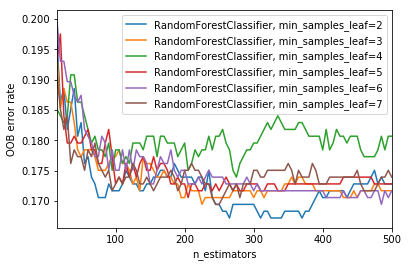

In [373]:
#Сценарий поиска параметров №2, аналогичный тому, что смотрели на лекции.
#Вначале я прогнал варианты с разной глубиной от 2 до 7, по графику лучшей показалась глубина 4
#Потом прогнал по количеству минимального семпла в листьях. Вроде, лучше остальных показал себя семпл==2


ensemble_list = [( "RandomForestClassifier, min_samples_leaf=2",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=2 )),                                 
    ( "RandomForestClassifier, min_samples_leaf=3",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=3 ))
    ,( "RandomForestClassifier, min_samples_leaf=4",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=4 ))
    ,( "RandomForestClassifier, min_samples_leaf=5",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=5 ))                
    ,( "RandomForestClassifier, min_samples_leaf=6",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=6 ))                
    ,( "RandomForestClassifier, min_samples_leaf=7",
        RandomForestClassifier(  oob_score=True,
                                 max_depth=4 ,
                                 max_features="sqrt" ,
                                 bootstrap=True, 
                                 warm_start=True,
                                 min_samples_leaf=7 ))                
                
]




error_rate = OrderedDict((label, []) for label, _ in ensemble_list)
     
     # Диапазон значений числа базовых деревьев
min_estimators = 15
max_estimators = 500

for label, clf in ensemble_list:
    for i in range(min_estimators, max_estimators + 1, 5):
        # Задаем число 
        clf.set_params(n_estimators=i)
        clf.fit(X_train, y_train)

        # Сохра
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()
     
     

In [375]:
# Дальше всякие тесты качества моделей

y_predicted = bestRFC.predict(X_train)
y_predicted_proba = bestRFC.predict_proba(X_train)

In [376]:
auc_prc( y_train, y_predicted, y_predicted_proba[:, 1] )

accuracy = 	0.837261503928
precision = 	0.895582329317
recall = 	0.652046783626
roc_auc = 	0.889983382865
prc_auc = 	0.875761743342


In [377]:
pr, re, thres = metrics.precision_recall_curve(y_train, y_predicted_proba[:, 1] )
fpr, tpr, thres2 = metrics.roc_curve( y_train, y_predicted_proba[:, 1])

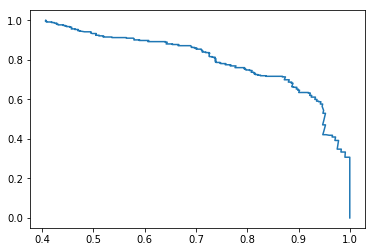

In [378]:
plt.plot(pr, re)

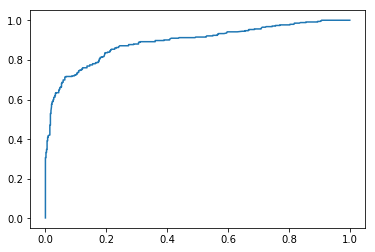

In [379]:
plt.plot(fpr, tpr)

### Подбираем параметры для модели №2 GradientBoosting 

In [405]:
# Здесь сценарий №1 подобора параметров бустинга по сетке
pipelineGBC = Pipeline( steps=[ (  "model", GradientBoostingClassifier()  ) ] )

paramsGBC = {"model__max_depth": list(range(3, 5, 1)),
             "model__max_features": list(range(2, 5, 1)),
             "model__min_samples_leaf": list(range( 3, 5, 1)),
             "model__min_samples_split": list(range(2, 5, 1)),
             "model__warm_start": [True, False],
            "model__n_estimators": list(range( 80, 140, 10 )),
             "model__subsample": [0.75, 0.85, 0.65],
            "model__learning_rate": [0.05, 0.075, 0.1, 0.125]}

#making a GridSearch
gridGBC = GridSearchCV(pipelineGBC, paramsGBC, 
                    scoring='accuracy', verbose=10, 
                    cv=kfold, n_jobs=-1)

In [406]:
#Заряжаем модель 
modelGBC = gridGBC.fit( X_train, y_train )

Fitting 4 folds for each of 5184 candidates, totalling 20736 fits
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2,

[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    0.5s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.7s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    2.3s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    3.0s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2,

[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    3.8s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    4.5s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:    5.6s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:    6.6s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed:    7.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    9.2s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:   10.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   12.0s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.865471, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:   13.3s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   14.6s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 213 tasks      | elapsed:   16.2s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:   17.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 257 tasks      | elapsed:   19.8s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_lea

[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   21.7s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 305 tasks      | elapsed:   23.4s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.865471, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:   24.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.865471, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   26.8s


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 384 tasks      | elapsed:   28.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, mo

[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:   31.6s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.865471, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   33.9s


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.860987, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[Parallel(n_jobs=-1)]: Done 473 tasks      | elapsed:   35.8s


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, 

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2,

[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   38.1s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:   40.8s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 570 tasks      | elapsed:   43.7s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 605 tasks      | elapsed:   45.8s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, 

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:   47.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:   50.6s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, mo

[Parallel(n_jobs=-1)]: Done 714 tasks      | elapsed:   53.3s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, 

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 753 tasks      | elapsed:   55.5s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.860987, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:   57.9s


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_le

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 833 tasks      | elapsed:  1.0min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:  1.1min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 917 tasks      | elapsed:  1.1min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_le

[Parallel(n_jobs=-1)]: Done 960 tasks      | elapsed:  1.2min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_le

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  1.2min


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 1050 tasks      | elapsed:  1.3min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 1097 tasks      | elapsed:  1.3min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1144 tasks      | elapsed:  1.4min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 1193 tasks      | elapsed:  1.5min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4,

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.771300, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, mode

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  1.5min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1293 tasks      | elapsed:  1.6min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__su

[Parallel(n_jobs=-1)]: Done 1344 tasks      | elapsed:  1.6min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1397 tasks      | elapsed:  1.7min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2,

[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  1.8min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1505 tasks      | elapsed:  1.8min


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3,

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3

[Parallel(n_jobs=-1)]: Done 1560 tasks      | elapsed:  1.9min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 1617 tasks      | elapsed:  2.0min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1674 tasks      | elapsed:  2.0min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 1733 tasks      | elapsed:  2.1min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model_

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  2.2min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 1853 tasks      | elapsed:  2.3min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.851351, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, m

[Parallel(n_jobs=-1)]: Done 1914 tasks      | elapsed:  2.4min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3

[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed:  2.5min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 2040 tasks      | elapsed:  2.6min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2105 tasks      | elapsed:  2.7min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.842342, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done 2170 tasks      | elapsed:  2.8min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2237 tasks      | elapsed:  2.8min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2304 tasks      | elapsed:  2.9min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, 

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2373 tasks      | elapsed:  3.0min


[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3,

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3,

[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed:  3.1min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4,

[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, mode

[Parallel(n_jobs=-1)]: Done 2513 tasks      | elapsed:  3.2min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed:  3.3min


[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, 

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2657 tasks      | elapsed:  3.4min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, mode

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2730 tasks      | elapsed:  3.5min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2805 tasks      | elapsed:  3.6min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 2880 tasks      | elapsed:  3.8min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 2957 tasks      | elapsed:  3.9min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3034 tasks      | elapsed:  4.0min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.771300, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3113 tasks      | elapsed:  4.1min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, m

[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed:  4.2min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.801802, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, mo

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3

[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed:  4.4min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_le

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4,

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, 

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 3354 tasks      | elapsed:  4.5min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, 

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3437 tasks      | elapsed:  4.6min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=2, model__min_samples_leaf

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.766816, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3520 tasks      | elapsed:  4.7min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, m

[Parallel(n_jobs=-1)]: Done 3605 tasks      | elapsed:  4.9min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3,

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.771300, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3690 tasks      | elapsed:  5.0min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 3777 tasks      | elapsed:  5.1min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, mode

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3864 tasks      | elapsed:  5.3min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.6s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2,

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 3953 tasks      | elapsed:  5.4min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=

[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed:  5.6min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf

[Parallel(n_jobs=-1)]: Done 4133 tasks      | elapsed:  5.7min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, mo

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3,

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__s

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, m

[Parallel(n_jobs=-1)]: Done 4224 tasks      | elapsed:  5.8min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, mode

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4317 tasks      | elapsed:  6.0min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, m

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, mode

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4410 tasks      | elapsed:  6.1min


[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2,

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mod

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 4505 tasks      | elapsed:  6.3min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, 

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4600 tasks      | elapsed:  6.4min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.5s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4697 tasks      | elapsed:  6.6min


[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.802691, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4,

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mod

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 4794 tasks      | elapsed:  6.7min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_lea

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, mod

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4893 tasks      | elapsed:  6.9min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 4992 tasks      | elapsed:  7.1min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, m

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__su

[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, mod

[Parallel(n_jobs=-1)]: Done 5093 tasks      | elapsed:  7.2min


[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.5s
[CV] model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.05, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.771300, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[Parallel(n_jobs=-1)]: Done 5194 tasks      | elapsed:  7.4min


[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 5297 tasks      | elapsed:  7.5min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 5400 tasks      | elapsed:  7.6min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.797297, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 5505 tasks      | elapsed:  7.7min


[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 5610 tasks      | elapsed:  7.9min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_lea

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=11

[Parallel(n_jobs=-1)]: Done 5717 tasks      | elapsed:  8.0min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, mod

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples

[Parallel(n_jobs=-1)]: Done 5824 tasks      | elapsed:  8.1min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_sampl

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_spli

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 5933 tasks      | elapsed:  8.3min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 6042 tasks      | elapsed:  8.4min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=2, model__min_samples

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=11

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 6153 tasks      | elapsed:  8.5min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.860987, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, mod

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 6264 tasks      | elapsed:  8.7min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.806306, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 6377 tasks      | elapsed:  8.8min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 6490 tasks      | elapsed:  9.0min


[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 6605 tasks      | elapsed:  9.1min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_le

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, mode

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.860987, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 6720 tasks      | elapsed:  9.2min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.771300, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_sampl

[Parallel(n_jobs=-1)]: Done 6837 tasks      | elapsed:  9.4min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 6954 tasks      | elapsed:  9.5min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.851351, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 7073 tasks      | elapsed:  9.7min


[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 7192 tasks      | elapsed:  9.8min


[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.852018, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 7313 tasks      | elapsed: 10.0min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 7434 tasks      | elapsed: 10.1min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples

[Parallel(n_jobs=-1)]: Done 7557 tasks      | elapsed: 10.3min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_sample

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_l

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spli

[Parallel(n_jobs=-1)]: Done 7680 tasks      | elapsed: 10.5min


[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110,

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 7805 tasks      | elapsed: 10.6min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=10

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 7930 tasks      | elapsed: 10.8min


[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spl

[Parallel(n_jobs=-1)]: Done 8057 tasks      | elapsed: 11.0min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, mode

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 8184 tasks      | elapsed: 11.2min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100,

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 8313 tasks      | elapsed: 11.4min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 8442 tasks      | elapsed: 11.6min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_sample

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.869955, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 8573 tasks      | elapsed: 11.7min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.766816, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=12

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.860987, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, mode

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 8704 tasks      | elapsed: 11.9min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 8837 tasks      | elapsed: 12.1min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.869955, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.842342, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 8970 tasks      | elapsed: 12.3min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 9105 tasks      | elapsed: 12.5min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_l

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=11

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, mod

[Parallel(n_jobs=-1)]: Done 9240 tasks      | elapsed: 12.7min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spli

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_sp

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 9377 tasks      | elapsed: 12.9min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=12

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 9514 tasks      | elapsed: 13.2min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_sample

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spl

[Parallel(n_jobs=-1)]: Done 9653 tasks      | elapsed: 13.4min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.865471, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 9792 tasks      | elapsed: 13.6min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.771300, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 9933 tasks      | elapsed: 13.8min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.865471, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_le

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_sample

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 10074 tasks      | elapsed: 14.0min


[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 10217 tasks      | elapsed: 14.2min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.860987, total=   0.5s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130,

[Parallel(n_jobs=-1)]: Done 10360 tasks      | elapsed: 14.4min


[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.075, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spli

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mod

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mod

[Parallel(n_jobs=-1)]: Done 10505 tasks      | elapsed: 14.6min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mode

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__

[Parallel(n_jobs=-1)]: Done 10650 tasks      | elapsed: 14.8min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.757848, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mode

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.771300, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 10797 tasks      | elapsed: 15.0min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, m

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[Parallel(n_jobs=-1)]: Done 10944 tasks      | elapsed: 15.1min


[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mode

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mod

[Parallel(n_jobs=-1)]: Done 11093 tasks      | elapsed: 15.3min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.762332, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4,

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mode

[Parallel(n_jobs=-1)]: Done 11242 tasks      | elapsed: 15.5min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model_

[Parallel(n_jobs=-1)]: Done 11393 tasks      | elapsed: 15.7min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model_

[Parallel(n_jobs=-1)]: Done 11544 tasks      | elapsed: 15.8min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mode

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.4s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 11697 tasks      | elapsed: 16.0min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 11850 tasks      | elapsed: 16.2min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mode

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, m

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 12005 tasks      | elapsed: 16.4min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mod

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsa

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 12160 tasks      | elapsed: 16.6min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, 

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, mod

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 12317 tasks      | elapsed: 16.8min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.806306, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.855856, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 12474 tasks      | elapsed: 17.0min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, m

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsamp

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mode

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mod

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mod

[Parallel(n_jobs=-1)]: Done 12633 tasks      | elapsed: 17.2min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 12792 tasks      | elapsed: 17.4min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, mod

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__

[Parallel(n_jobs=-1)]: Done 12953 tasks      | elapsed: 17.6min


[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.766816, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.771300, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model_

[Parallel(n_jobs=-1)]: Done 13114 tasks      | elapsed: 17.8min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsamp

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.771300, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.815315, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mode

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.762332, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model_

[Parallel(n_jobs=-1)]: Done 13277 tasks      | elapsed: 18.0min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.766816, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsa

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__

[Parallel(n_jobs=-1)]: Done 13440 tasks      | elapsed: 18.3min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.4s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, m

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mode

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 13605 tasks      | elapsed: 18.5min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mod

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 13770 tasks      | elapsed: 18.8min


[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mod

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mod

[Parallel(n_jobs=-1)]: Done 13937 tasks      | elapsed: 19.0min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsa

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mod

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 14104 tasks      | elapsed: 19.3min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.869955, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model_

[Parallel(n_jobs=-1)]: Done 14273 tasks      | elapsed: 19.5min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.771300, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, mod

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model_

[Parallel(n_jobs=-1)]: Done 14442 tasks      | elapsed: 19.8min


[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__sub

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__su

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, mod

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.2s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, mode

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 14613 tasks      | elapsed: 20.0min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.860987, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[Parallel(n_jobs=-1)]: Done 14784 tasks      | elapsed: 20.3min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.860987, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mo

[Parallel(n_jobs=-1)]: Done 14957 tasks      | elapsed: 20.6min


[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.5s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model_

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mod

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mod

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mo

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, mode

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__

[Parallel(n_jobs=-1)]: Done 15130 tasks      | elapsed: 20.8min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model_

[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.856502, total=   0.3s
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n

[Parallel(n_jobs=-1)]: Done 15305 tasks      | elapsed: 21.1min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mod

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, m

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model_

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[Parallel(n_jobs=-1)]: Done 15480 tasks      | elapsed: 21.3min


[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, mo

[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.1, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, m

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 15657 tasks      | elapsed: 21.6min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_l

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 15834 tasks      | elapsed: 21.8min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.810811, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_le

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.801802, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, mo

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 16013 tasks      | elapsed: 22.0min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.846847, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_le

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_l

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 16192 tasks      | elapsed: 22.3min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_sample

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=13

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 16373 tasks      | elapsed: 22.5min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.771300, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120,

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 16554 tasks      | elapsed: 22.8min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 16737 tasks      | elapsed: 23.0min


[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.771300, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spli

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.766816, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[Parallel(n_jobs=-1)]: Done 16920 tasks      | elapsed: 23.2min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 17105 tasks      | elapsed: 23.5min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.846847, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=10

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.766816, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=3, model__min_samples_leaf=4, model__min_samples_spl

[Parallel(n_jobs=-1)]: Done 17290 tasks      | elapsed: 23.7min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_l

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.842342, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 17477 tasks      | elapsed: 23.9min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.842342, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_sample

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 17664 tasks      | elapsed: 24.2min


[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.842342, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=3, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.801802, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[Parallel(n_jobs=-1)]: Done 17853 tasks      | elapsed: 24.4min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.860987, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.851351, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.837838, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.860987, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 18042 tasks      | elapsed: 24.7min


[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.828829, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120,

[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=13

[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=3, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_sample

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_spl

[Parallel(n_jobs=-1)]: Done 18233 tasks      | elapsed: 24.9min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.789238, total=   0.5s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.869955, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.807175, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_sampl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.833333, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.865471, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 


[Parallel(n_jobs=-1)]: Done 18424 tasks      | elapsed: 25.3min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_sampl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.843049, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_sample

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.874439, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.819820, total=   0.6s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 18617 tasks      | elapsed: 25.6min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_sp

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.802691, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 18810 tasks      | elapsed: 25.9min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.780269, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=11

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 


[Parallel(n_jobs=-1)]: Done 19005 tasks      | elapsed: 26.2min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.2s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=2, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.801802, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.810811, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.806306, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.797297, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_lea

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.811659, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spli

[Parallel(n_jobs=-1)]: Done 19200 tasks      | elapsed: 26.5min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.843049, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.801802, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.771300, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_sp

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, mod

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.856502, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.869955, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 19397 tasks      | elapsed: 26.8min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.815315, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=3, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.829596, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.792793, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120,

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 19594 tasks      | elapsed: 27.1min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=False, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_lea

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.833333, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.801802, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.771300, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.843049, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.820628, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.775785, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.801802, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 19793 tasks      | elapsed: 27.4min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.860987, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.811659, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=3, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.75, model__warm_start=False, score=0.798206, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 19992 tasks      | elapsed: 27.8min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.847534, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=True, score=0.833333, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.802691, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.788288, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.789238, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_sample

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[Parallel(n_jobs=-1)]: Done 20193 tasks      | elapsed: 28.1min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.825112, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.85, model__warm_start=False, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.856502, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=110,

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.793722, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.824324, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.85, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=3, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.865471, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.820628, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.819820, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=90, m

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.828829, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.865471, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False, score=0.802691, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_

[Parallel(n_jobs=-1)]: Done 20394 tasks      | elapsed: 28.4min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=110, model__subsample=0.65, model__warm_start=False, score=0.816143, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.85, model__warm_start=False, score=0.806306, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=True, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=120, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=2, model__n_estimators=130, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.852018, total=   0.2s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=True, score=0.792793, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=90, model__subsample=0.65, model__warm_start=False 
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spli

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.834081, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.810811, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.811659, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.829596, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.780269, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.816143, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=120, model__subsample=0.65, model__warm_start=False, score=0.797297, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.784753, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.807175, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.819820, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=3, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[Parallel(n_jobs=-1)]: Done 20597 tasks      | elapsed: 28.7min


[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.75, model__warm_start=False, score=0.847534, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True, score=0.798206, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=80, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.829596, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=True, score=0.852018, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.793722, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=90, model__subsample=0.65, model__warm_start=False, score=0.806306, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.75, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_spl

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True, score=0.784753, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.85, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=100, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.838565, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=True, score=0.815315, total=   0.3s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=110, model__subsample=0.85, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.820628, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.75, model__warm_start=False, score=0.824324, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=120, model__subsample=0.85, model__warm_start=True 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.789238, total=   0.4s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=True, score=0.798206, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.75, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_s

[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=True, score=0.810811, total=   0.5s
[CV] model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False 
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.784753, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samples_leaf=4, model__min_samples_split=4, model__n_estimators=130, model__subsample=0.65, model__warm_start=False, score=0.825112, total=   0.4s
[CV]  model__learning_rate=0.125, model__max_depth=4, model__max_features=4, model__min_samp

[Parallel(n_jobs=-1)]: Done 20736 out of 20736 | elapsed: 29.0min finished


"\n{'model__max_depth': 3,\n 'model__max_features': 3,\n 'model__min_samples_leaf': 4,\n 'model__min_samples_split': 3}\n"

In [407]:
#лучшие предложенные параметры, но они снова не сыграли в плюс, поэтому обратился к сценарию №2
modelGBC.best_params_

{'model__learning_rate': 0.05,
 'model__max_depth': 4,
 'model__max_features': 4,
 'model__min_samples_leaf': 4,
 'model__min_samples_split': 4,
 'model__n_estimators': 80,
 'model__subsample': 0.65,
 'model__warm_start': False}

In [444]:
# создаю отдельную модель с предложенными параметрами для ускорения расчета

bestGBC = GradientBoostingClassifier( n_estimators=85  
                                 , max_depth=4
                                 , max_features=4 
                                 , min_samples_leaf=4
                                 , min_samples_split=3 
                                 , warm_start=False
                                 , subsample=0.65
                                 , learning_rate=0.05  )
bestGBC.fit( X_train, y_train )
scores = cross_val_score(bestGBC, X_train, y_train, cv=kfold, scoring='accuracy' )
print("average score GBC: ", np.mean(scores) )


average score GBC:  0.822678059225


In [410]:
# снова разные проверки качества модели

y_predicted = bestGBC.predict(X_train)
y_predicted_proba = bestGBC.predict_proba(X_train)

In [411]:
auc_prc( y_train, y_predicted, y_predicted_proba[:, 1] )

accuracy = 	0.864197530864
precision = 	0.877133105802
recall = 	0.751461988304
roc_auc = 	0.927318676168
prc_auc = 	0.913097387126


In [412]:
pr, re, thres = metrics.precision_recall_curve(y_train, y_predicted_proba[:, 1] )
fpr, tpr, thres2 = metrics.roc_curve( y_train, y_predicted_proba[:, 1])

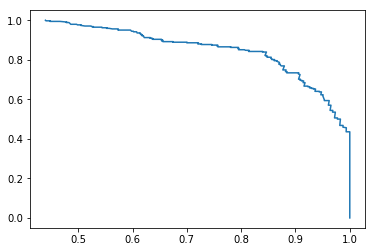

In [413]:
plt.plot(pr, re)

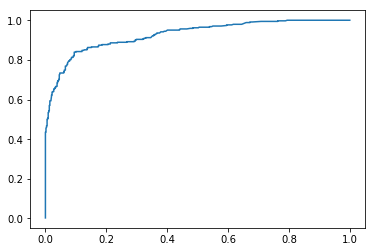

In [414]:
plt.plot(fpr, tpr)

## Возврат к стеккингу моделей

In [415]:
# инициализирем модели с подобранными гиперпараметрами

# Передаю объекты моделей в созданные вами переменные


#rf_estimator = RandomForestClassifier()
#gb_estimator = GradientBoostingClassifier()

rf_estimator = bestRFC
gb_estimator = bestGBC
#knn_estimator = bestKNN




# получаем предсказания вероятностей ансамблей на кросс-валидации для обучающей выборки
rf_train_pred = cross_val_predict_proba(rf_estimator, X_train, y_train)
gb_train_pred = cross_val_predict_proba(gb_estimator, X_train, y_train)


#rf_train_pred = cross_val_predict_proba(bestRFC, X_train, y_train)
#gb_train_pred = cross_val_predict_proba(bestGBC, X_train, y_train)




X_train_stack = np.stack([rf_train_pred[:,1], gb_train_pred[:,1]], axis=1)

# получаем предсказания ансамблей для тестовой выборки
rf_test_pred = rf_estimator.fit(X_train, y_train).predict_proba(X_test)
gb_test_pred = gb_estimator.fit(X_train, y_train).predict_proba(X_test)

X_test_stack = np.stack([rf_test_pred[:,1], gb_test_pred[:,1]], axis=1)

/home/ivan/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:303: UserWarning: Warm-start fitting without increasing n_estimators does not fit new trees.
  warn("Warm-start fitting without increasing n_estimators does not "


## Объединяем предсказания ансамблей с помощью логистической регрессии

## Подбираем гиперпараметры LogisticRegression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [435]:
# Первый перебор показал, что значение С лежит ближе к 1, чем к 10 / 100. Поэтому дальше поиск по сетке был в пределах 1


paramsLogReg = {"C": [0.06132, 0.06135, 0.06137, 1.2, 1.25, 1.15, 1.23, 1.17, 1.26, 1.27, 1.28, 1.25,
                     1.261, 1.262, 1.263, 1.264, 1.265, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.043, 0.44, 0.37, 0.41, 
                     0.0435, 0.0431, 0.0433, 0.0428, 0.0426, 0.0429]}

#making a GridSearch
gridLogReg = GridSearchCV(LogisticRegression() , paramsLogReg, 
                          scoring="accuracy", cv=kfold, verbose=5, n_jobs=-1)

In [436]:
#start a model training and look at best parameters
modelLogReg = gridLogReg.fit( X_train_stack, y_train )
modelLogReg.best_params_

Fitting 4 folds for each of 33 candidates, totalling 132 fits
[CV] C=0.06132 .......................................................
[CV] C=0.06132 .......................................................
[CV] C=0.06132 .......................................................
[CV] C=0.06132 .......................................................
[CV] ........................ C=0.06132, score=0.825112, total=   0.0s
[CV] ........................ C=0.06132, score=0.833333, total=   0.0s
[CV] ........................ C=0.06135, score=0.789238, total=   0.0s
[CV] ........................ C=0.06132, score=0.789238, total=   0.0s
[CV] C=0.06135 .......................................................
[CV] ........................ C=0.06132, score=0.856502, total=   0.0s
[CV] C=0.06135 .......................................................
[CV] C=0.06135 .......................................................
[CV] ........................ C=0.06135, score=0.825112, total=   0.0s
[CV] C=0.06135 

[CV] .......................... C=1.262, score=0.780269, total=   0.0s
[CV] C=1.263 .........................................................
[CV] C=1.262 .........................................................
[CV] ........................... C=1.25, score=0.828829, total=   0.0s
[CV] .......................... C=1.262, score=0.834081, total=   0.0s
[CV] .......................... C=1.263, score=0.828829, total=   0.0s
[CV] .......................... C=1.265, score=0.847534, total=   0.0s
[CV] C=1.264 .........................................................
[CV] C=1.262 .........................................................
[CV] C=0.02 ..........................................................
[CV] .......................... C=1.262, score=0.847534, total=   0.0s
[CV] C=1.265 .........................................................
[CV] ........................... C=0.02, score=0.784753, total=   0.0s
[CV] C=1.262 .........................................................
[CV] C

[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.3s


[CV] .......................... C=1.264, score=0.828829, total=   0.0s
[CV] C=0.03 ..........................................................
[CV] ......................... C=0.0435, score=0.789238, total=   0.0s
[CV] .......................... C=0.043, score=0.834081, total=   0.0s
[CV] C=0.0435 ........................................................
[CV] C=0.043 .........................................................
[CV] C=0.0426 ........................................................
[CV] ......................... C=0.0435, score=0.834081, total=   0.0s
[CV] ........................... C=0.03, score=0.829596, total=   0.0s
[CV] .......................... C=0.043, score=0.856502, total=   0.0s
[CV] ......................... C=0.0426, score=0.856502, total=   0.0s
[CV] C=0.0435 ........................................................
[CV] C=0.03 ..........................................................
[CV] C=0.043 .........................................................
[CV] .

[Parallel(n_jobs=-1)]: Done 132 out of 132 | elapsed:    0.8s finished


{'C': 0.043}

In [437]:
# Создаем отдельную модель логита с отобранным значением параметра С

bestLogReg = LogisticRegression(C=0.043) #C=1.26
bestLogReg.fit( X_train_stack, y_train )

scores = cross_val_score(bestLogReg, X_train_stack, y_train, cv=kfold, scoring='accuracy' )
print("average score LogReg: ", np.mean(scores) )

average score LogReg:  0.82941461641


In [419]:
# Снова проверка качества модели

y_predicted = logreg.predict(X_train_stack)
y_predicted_proba = logreg.predict_proba(X_train_stack)

In [420]:
pr, re, thres = metrics.precision_recall_curve(y_train, y_predicted_proba[:, 1] )
fpr, tpr, thres2 = metrics.roc_curve( y_train, y_predicted_proba[:, 1])

In [421]:
auc_prc( y_train, y_predicted, y_predicted_proba[:, 1] )

accuracy = 	0.82379349046
precision = 	0.836363636364
recall = 	0.672514619883
roc_auc = 	0.865779354275
prc_auc = 	0.849106525266


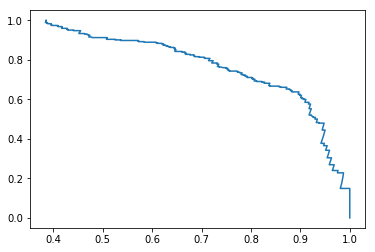

In [422]:
plt.plot(pr, re)

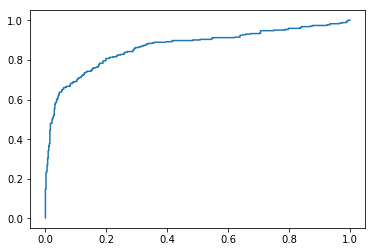

In [423]:
plt.plot(fpr, tpr)

In [424]:
# 

logreg = bestLogReg
predicted = logreg.predict(X_test_stack)

## Формируем файл для отправки

In [425]:
with open('submission08.txt', 'w') as out:
    out.write('PassengerId,Survived\n')
    for passenger, y in zip(test['PassengerId'], predicted):
        out.write('%s,%s\n' % (passenger, y))